In [272]:
#
import subprocess
import shlex
import pandas as pd
import numpy as np
import glob
import os
import wget
import requests
import glob
import time
import h5py
from Bio import AlignIO
treefile = './covid19/gisaid_hcov-2020_08_25.QC.NSoutlier.filter.deMaiomask.aln.EPIID.treefile'
alnfile = '/home/cactuskid13/covid/lucy_mk3/gisaid_hcov-2020_08_25.QC.NSoutlier.filter.deMaiomask.EPIID.aln'
alnh5 = alnfile+'.h5'
events = './covid19/*_coevmat.pkl'
eventmats = glob.glob(events)

In [273]:
models = '6vxx,6zxn,5x58,6cs0,6sc1,6nb6, 2jw8, 2xab, 4aud1, 1yo4, 2acf, 2wct, 3vc8, 2gt7, 3ee7, 2g9t, 3ee7, 2g9t, 6jyt, 1ysy, 6nur, 2g9t, 5c8u, 2g9t, 2xyq, 4mm3, 6cs2, 6acg, 6acj, 6ack, 2dd8, 2ghw, 6nb6, 6nb7'
#models = '6vxx,6zxn'
models = models.split(',')
templatedir = './covid19/'

In [274]:
with h5py.File(alnh5, 'r') as hf:
    align_array = hf['MSA2array'][:]
msa = AlignIO.read(alnfile , format = 'fasta')

def clipID(ID):
    return ''.join( [ s +'|' for s in str(ID).split('|')[:-1] ])[:-1].replace('_',' ') 
IDs = {i:rec.id for i,rec in enumerate(msa)}
IDindex = dict(zip( IDs.values() , IDs.keys() ) )
print( [(t,IDindex[t]) for t in list(IDindex.keys())[0:10]] )

[('EPI_ISL_475635', 0), ('EPI_ISL_425848', 1), ('EPI_ISL_433289', 2), ('EPI_ISL_439066', 3), ('EPI_ISL_433434', 4), ('EPI_ISL_417064', 5), ('EPI_ISL_434563', 6), ('EPI_ISL_434564', 7), ('EPI_ISL_425865', 8), ('EPI_ISL_464788', 9)]


In [275]:
print(align_array.shape)

(54768, 29903)


In [ ]:

clear = False

In [8]:
if not os.path.isdir(templatedir):
    os.mkdir(templatedir)
if clear == True:
    files = glob.glob(templatedir+'*.pdb')
    for f in files:
        os.remove(f)

In [5]:
from Bio.PDB import *
dl_url = 'http://files.rcsb.org/download/'
dl_url_err = 'http://files.rcsb.org/download/'

structs = {}
already = glob.glob( templatedir+'/*.pdb' )
print(already)
#pull complexes
for m in models:
    structfile = templatedir+m.upper().strip()+'.pdb'
    if structfile not in already:
        print(m)
        time.sleep(1)
        try:
            wget.download(url = dl_url + m.strip() +'.pdb' , out =structfile)
            structs[m] = structfile
        except:
            try:
                wget.download(url = dl_url + m.strip() +'.pdb' , out =structfile)
                structs[m] = structfile
            except:
                print('err', m )
    else:
        structs[m.strip()] = structfile


['./covid19/4MM3.pdb', './covid19/2WCT.pdb', './covid19/6SC1.pdb', './covid19/6crz.pdb', './covid19/3VC8.pdb', './covid19/2JW8.pdb', './covid19/2GHW.pdb', './covid19/2XAB.pdb', './covid19/5X58.pdb', './covid19/1YO4.pdb', './covid19/6ACG.pdb', './covid19/6ACJ.pdb', './covid19/6ZXN.pdb', './covid19/6ACK.pdb', './covid19/5C8U.pdb', './covid19/6VXX.pdb', './covid19/6NUR.pdb', './covid19/6CS0.pdb', './covid19/2G9T.pdb', './covid19/3EE7.pdb', './covid19/6CS2.pdb', './covid19/2ACF.pdb', './covid19/2GT7.pdb', './covid19/2DD8.pdb', './covid19/6NB7.pdb', './covid19/6JYT.pdb', './covid19/2XYQ.pdb', './covid19/1YSY.pdb', './covid19/6NB6.pdb']
 4aud1
err  4aud1


In [2]:

#collapse codons
#use blastx to map to prot
#the annotation file is need for coevsankof.py
qfile =  './dengue/dengue_refgeno.fasta'

def runblastx( qseq , outannot = alnfile+'blastout.txt' , outfmt = None ):
    if outfmt is None:
        outfmt = [ 'qseqid' , 'sseqid' , 'qlen' ,  'slen' , 'qstart' , 'qend' ,  'qframe' , 'evalue' ]
        outfmt =  ' "10 ' + ''.join([fmt+ ' ' for fmt in outfmt]) + ' " '
        print(outfmt)
    args = 'blastx -query '+ qfile + ' -db ./dengue/dengue_prots -outfmt' + outfmt + ' -out ' + outannot  
    p = subprocess.run( shlex.split(args) )
    return p , outannot
out = alnfile+'blastout.txt'
p,annot = runblastx(qfile  )

annotation = pd.read_csv( out , header = None )
annotation.columns = [ 'qseqid' , 'sseqid' , 'qlen' ,  'slen' , 'qstart' , 'qend' ,  'qframe' , 'evalue' ] 
annotation = annotation[ annotation['evalue'] < 10**-3 ]
print(annotation)
print(len(annotation), ' orfs detected')
annotation.to_csv( alnfile +'annotation.csv'  )
#make annotation for dengue orfs


 "10 qseqid sseqid qlen slen qstart qend qframe evalue  " 
     qseqid                              sseqid   qlen  slen  qstart   qend  \
0  FJ639811  lcl|NC_001474.2_prot_NP_056776.2_1  10684  3391      73  10248   

   qframe  evalue  
0       1     0.0  
1  orfs detected


In [276]:
#
from Bio import Seq , SeqIO
rows = []
for ID in annotation.sseqid.unique():
    #print(annotation[annotation.sseqid == ID ].iloc[0])
    sub = annotation[annotation.sseqid == ID ]
    rows.append(sub.index[0] ) 
annotation = annotation.loc[rows]
print(len(annotation))
rows = []
for ID in annotation.qstart.unique():
    sub = annotation[annotation.qstart == ID ]
    rows.append(sub.index[0] )
annotation = annotation.loc[rows]
print(len(annotation))
genes =  {}
prots = {}
#parse full reference dengue genome
qseq = next(SeqIO.parse( './dengue/dengue_refgeno.fasta' , 'fasta'))
print(qseq)
print(len(qseq))
for i,r in annotation.iterrows():
    genes[i] = qseq[r.qstart-1:r.qend-1]
    #print(genes[i])
    prots[i] = genes[i].translate( )
    annotation = annotation.sort_values( ['qstart'] )
annotation['prots'] = annotation.index.map(prots)
annotation['genes'] = annotation.index.map(genes)
annotation['prots'] =annotation['prots'].map(lambda x : ''.join(x).strip())
annotation['genes'] = annotation['genes'].map(lambda x : ''.join(x).strip())
annotation = annotation[annotation.slen < 2000]
aln_regions = np.array(list(zip(list(annotation.qstart),list(annotation.qend))))
#aln_regions= aln_regions[1:,:]
aln_len = np.array(list( annotation.qend - annotation.qstart))
annotation = pd.DataFrame.sort_values(annotation, by='qstart')
print(annotation)


3
1


FileNotFoundError: [Errno 2] No such file or directory: './dengue/dengue_refgeno.fasta'

In [277]:
from sklearn.cluster import *
import scipy
import copy
import numpy as np
from numpy import linalg as LA
from matplotlib import pyplot as plt
from Bio import AlignIO
import random
import pickle
import h5py
import itertools
import dendropy
import numpy as np
import seaborn as sns
import os
jk_iterations = 5
mapping = {'A':0 , 'T':1 , 'C':2 ,'G':3 }
os.environ['MKL_ENABLE_INSTRUCTIONS'] = 'AVX2'

In [278]:
print(eventmats)

['./covid19/gisaid_hcov-2020_08_25.QC.NSoutlier.filter.deMaiomask.EPIID.alnsparsemat_AAtransitionbootstrap_runbootstrap_run_transition_AC_coevmat.pkl', './covid19/gisaid_hcov-2020_08_25.QC.NSoutlier.filter.deMaiomask.EPIID.alnsparsemat_AAtransitionbootstrap_runbootstrap_run_transition_GA_coevmat.pkl', './covid19/gisaid_hcov-2020_08_25.QC.NSoutlier.filter.deMaiomask.EPIID.alnsparsemat_AAtransitionbootstrap_runbootstrap_run_transition_AG_coevmat.pkl', './covid19/gisaid_hcov-2020_08_25.QC.NSoutlier.filter.deMaiomask.EPIID.alnsparsemat_AAtransitionbootstrap_runbootstrap_run_transition_CG_coevmat.pkl', './covid19/gisaid_hcov-2020_08_25.QC.NSoutlier.filter.deMaiomask.EPIID.alnsparsemat_AAtransitionbootstrap_runbootstrap_run_transition_CA_coevmat.pkl', './covid19/gisaid_hcov-2020_08_25.QC.NSoutlier.filter.deMaiomask.EPIID.alnsparsemat_AAtransitionbootstrap_runbootstrap_run_transition_GC_coevmat.pkl', './covid19/gisaid_hcov-2020_08_25.QC.NSoutlier.filter.deMaiomask.EPIID.alnsparsemat_AAtransit

In [279]:
import sys
sys.setrecursionlimit(10**6)
tree = dendropy.Tree.get(
    path=treefile,
    schema='newick')
treelen = tree.length()
treenodes = len(tree.nodes())
print('nodes',treenodes)
print('length',treelen)

nodes 109535
length 1.644361063899128


./covid19/gisaid_hcov-2020_08_25.QC.NSoutlier.filter.deMaiomask.EPIID.alnsparsemat_AAtransitionbootstrap_runbootstrap_run_transition_AC_coevmat.pkl
1241.0
./covid19/gisaid_hcov-2020_08_25.QC.NSoutlier.filter.deMaiomask.EPIID.alnsparsemat_AAtransitionbootstrap_runbootstrap_run_transition_GA_coevmat.pkl
5895.0
./covid19/gisaid_hcov-2020_08_25.QC.NSoutlier.filter.deMaiomask.EPIID.alnsparsemat_AAtransitionbootstrap_runbootstrap_run_transition_AG_coevmat.pkl
7343.0
./covid19/gisaid_hcov-2020_08_25.QC.NSoutlier.filter.deMaiomask.EPIID.alnsparsemat_AAtransitionbootstrap_runbootstrap_run_transition_CG_coevmat.pkl
323.0
./covid19/gisaid_hcov-2020_08_25.QC.NSoutlier.filter.deMaiomask.EPIID.alnsparsemat_AAtransitionbootstrap_runbootstrap_run_transition_CA_coevmat.pkl
1556.0
./covid19/gisaid_hcov-2020_08_25.QC.NSoutlier.filter.deMaiomask.EPIID.alnsparsemat_AAtransitionbootstrap_runbootstrap_run_transition_GC_coevmat.pkl
954.0
./covid19/gisaid_hcov-2020_08_25.QC.NSoutlier.filter.deMaiomask.EPIID.al

<AxesSubplot:>

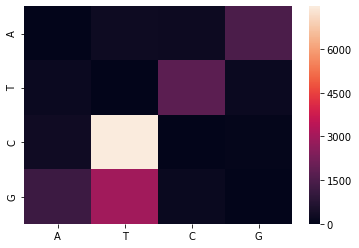

In [281]:
transitionmat = np.zeros( (4,4))
#the number of actual events recorded should be number of transitions recorded / jk_iterations
coevmats_raw = {}
prefix = './covid19/gisaid_hcov-2020_08_25.QC.NSoutlier.filter.deMaiomask.EPIID.alnsparsemat_AAtransitionbootstrap_runbootstrap_run_transition_'
for outsankof in eventmats:
    print(outsankof)
    transition_type = outsankof.replace(prefix  , '')
    transition_type = transition_type.replace( '_coevmat.pkl' , '')
    transition_type = transition_type.replace("'" , '')
    
    with open( outsankof , 'rb') as matin:
        coevmat = pickle.loads(matin.read())[1]
    
    print(np.sum(coevmat))
    row = mapping[ transition_type[0] ]
    col = mapping[ transition_type[1] ]
    transitionmat[row,col] = coevmat.sum()
    transitionmat[row,col]/= jk_iterations
    coevmat/=jk_iterations
    coevmats_raw[transition_type] = coevmat.todense()

sns.heatmap(transitionmat, xticklabels= mapping.keys( ) , yticklabels=mapping.keys())  

5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0
5.0


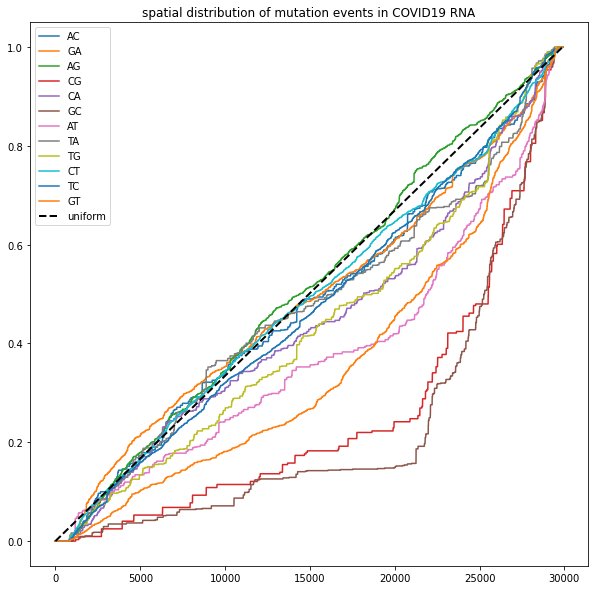

In [282]:
plt.figure( figsize = (10,10))

for outsankof in eventmats:

    transition_type = outsankof.replace(prefix  , '')
    transition_type = transition_type.replace( '_coevmat.pkl' , '')
    transition_type = transition_type.replace("'" , '')
    with open( outsankof , 'rb') as matin:
        coevmat = pickle.loads(matin.read())[1]
    coevmat = coevmat.todense()
    print(np.amax(coevmat))
    
    sumv = np.sum(coevmat , axis = 0)
    cdf = np.array( np.cumsum(sumv) / np.sum(sumv))
    plt.plot( cdf[0] , label= transition_type  )
    
cdf_uniform = np.cumsum(np.ones(len(cdf.ravel())) ) / np.sum(len(cdf.ravel()))
plt.plot(cdf_uniform, lw = 2 , ls = 'dashed' , c = 'black' , label= 'uniform')
plt.legend()
plt.title( 'spatial distribution of mutation events in COVID19 RNA' )
plt.show()

In [ ]:
tensor = []
coevmats_raw = {}
thresh_mats = .2
for i,outsankof in enumerate(eventmats):
    with open( outsankof , 'rb') as matin:
        coevmat = pickle.loads(matin.read())[1]
    coevmat = coevmat.todense()
    coevmat/= jk_iterations 
    if i == 0:
        globalmat_thresh = coevmat
        globalmat_thresh[thresh_mats > globalmat_thresh ] = 0        
    else:
        coevmat[thresh_mats > coevmat] = 0
        globalmat_thresh+= coevmat


for i,outsankof in enumerate(eventmats):
    with open( outsankof , 'rb') as matin:
        coevmat = pickle.loads(matin.read())[1]
    tensor.append( coevmat )
    coevmat = coevmat.todense()
    coevmat/= jk_iterations 
    if i == 0:
        globalmat = coevmat
    else:
        globalmat+= coevmat
    
    transition_type = outsankof.replace(prefix  , '')
    transition_type = transition_type.replace( '_coevmat.pkl' , '')
    transition_type = transition_type.replace("'" , '')
    coevmats_raw[transition_type] = coevmat
    
    
    plt.hist( coevmat[coevmat>0].flat , bins = 40 )
    plt.show()
    plt.figure(figsize=(20,10))
    plt.spy(coevmat, markersize= .5)
    plt.title(outsankof)
    plt.show()
plt.figure(figsize=(20,10))
plt.title('all mutations')
plt.spy(globalmat,markersize= .5)
plt.show()

bigstack = np.vstack(tensor)

(109535, 29903, 380)


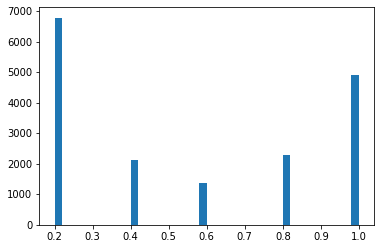

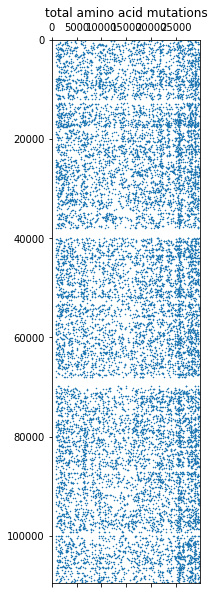

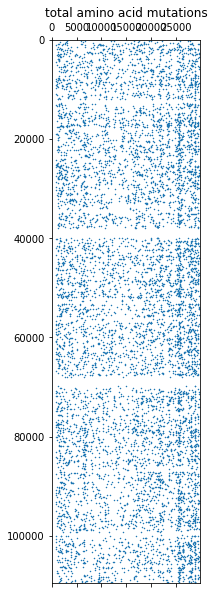

In [283]:
#load sparse ND array
ProteinAlphabet = [ 'A', 'C', 'D', 'E', 'F', 'G', 'H', 'I', 'K', 'L', 'M', 'N', 'P', 'Q', 'R', 'S', 'T', 'V', 'W', 'Y' ]
allowed_AA_transitions = [ c1+c2 for c1 in ProteinAlphabet for c2 in ProteinAlphabet  if c1!= c2]
transitiondict_AA = {  c : i  for i,c in enumerate( allowed_AA_transitions )  }
rev_transitiondict_AA = dict( zip(transitiondict_AA.values(), transitiondict_AA.keys()))

outsankof = './covid19/gisaid_hcov-2020_08_25.QC.NSoutlier.filter.deMaiomask.EPIID.alnsparsemat_AAtransitionbootstrap_runbootstrap_run_coevmat_AAmutations.pkl'

bootstraps = 5
#condense to global mat
with open( outsankof , 'rb') as matin:
    AAtensor = pickle.loads(matin.read())[1]/bootstraps
    print(AAtensor.shape)
    
    for i in range( AAtensor.shape[2] ):
        ''' if i < 5:
        coevmat = AAtensor[:,:,i]
        print(coevmat)
        plt.hist( coevmat[coevmat>0].flat , bins = 40 )
        plt.show()
        plt.figure(figsize=(20,10))
        plt.spy(coevmat, markersize= .5)
        plt.title(rev_transitiondict_AA[i])
        plt.show()'''
        if i == 0:
            AAmat =  AAtensor[:,:,i]
        else:
            AAmat +=  AAtensor[:,:,i]

            
AAmat = AAmat.todense()
plt.hist( AAmat[AAmat>0].flat , bins = 40 )
plt.show()

plt.figure(figsize=(20,10))
plt.spy(AAmat, markersize= .5)
plt.title('total amino acid mutations')
plt.show()

thresh = .5
AAmat[AAmat<thresh]=0

plt.figure(figsize=(20,10))
plt.spy(AAmat, markersize= .5)
plt.title('total amino acid mutations')
plt.show()

In [284]:
#use tree to blur eventmat
from Bio import AlignIO
tree = dendropy.Tree.get(
    path=treefile,
    schema='newick')
col = 525
aln_col = align_array[:,col]
def clipID(ID):
    return ID.replace('/',' ')

msa = AlignIO.read(alnfile , format = 'fasta')    
IDs = {i:clipID(rec.id) for i,rec in enumerate(msa)}
#IDs = {i:rec.id for i,rec in enumerate(msa)}
IDindex = dict(zip( IDs.values() , IDs.keys() ) )
matsize = len(tree.nodes())
#add chars to leaves
for i,l in enumerate(tree.leaf_nodes()):
    if l.taxon.label in IDindex:
        l.taxon.label += ' '+ aln_col[IDindex[l.taxon.label]].decode()

#add events
for i,n in enumerate(tree.nodes()):
    if globalmat[i,col]>0:
        n.label = str( globalmat[i,col] )
    else:
        n.label = ''
#vis w event proba 
#tree.print_plot( show_internal_node_labels = True , width = 100)

109535
nodes


/home/cactuskid13/miniconda3/envs/pyprofiler3/lib/python3.7/site-packages/scipy/sparse/_index.py:127: SparseEfficiencyWarning: Changing the sparsity structure of a csc_matrix is expensive. lil_matrix is more efficient.
  self._set_arrayXarray(i, j, x)


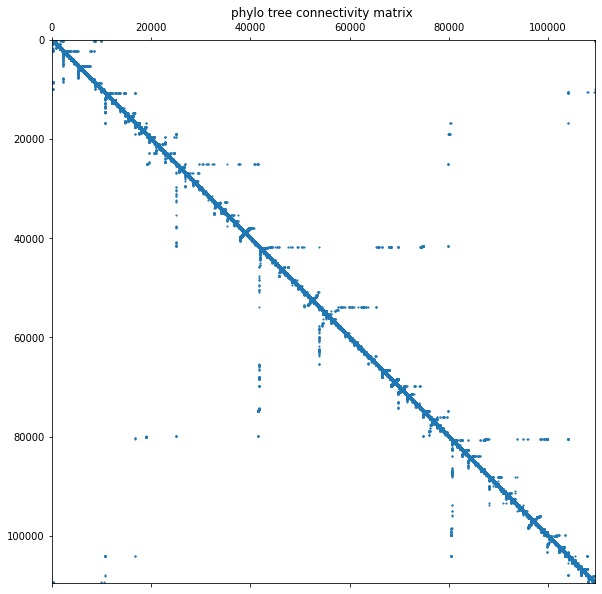

In [285]:
for i,n in enumerate(tree.nodes()):
    n.matrow = i
    n.symbols = None
    n.scores = None
    n.event = None
    n.char = None

matsize = len(tree.nodes())
print(matsize)
print('nodes')

#blur w connectivity mat
blurfactor =  .25

connectmat = scipy.sparse.csc_matrix((len(tree.nodes()), len(tree.nodes() ) ) )
index = np.array([ [n.matrow, c.matrow ] for n in tree.nodes() for c in n.child_nodes()])
lengths = np.array([ c.edge_length for n in tree.nodes() for c in n.child_nodes()])
total_len = np.sum(lengths)
#fill diagonal
#index = np.vstack( [index , np.array([ [n.matrow, n.matrow ] for n in tree.nodes() ]) ] )

connectmat[index[:,0],index[:,1]] = 1
connectmat[index[:,1],index[:,0]] = 1

#connectmat = connectmat.todense()
diag = [ i for i in range(connectmat.shape[0])]
connectmat[diag,diag] = 1
#connectmat = connectmat.todense()
#connectmat = scipy.sparse.csc_matrix(connectmat)

#np.fill_diagonal(connectmat , 1)

plt.figure( figsize=(10,10))
plt.title( 'phylo tree connectivity matrix ' )
plt.spy(connectmat, markersize= 1)
plt.show()

In [286]:
######important 
mapping = {'A':0 , 'T':1 , 'C':2 ,'G':3 }
transitions = [ char1+char2  for char1 in mapping.keys() for char2 in mapping.keys()]
transitionmap = { t:i for i,t in enumerate(transitions) }
print(transitionmap)
print(mapping)

{'AA': 0, 'AT': 1, 'AC': 2, 'AG': 3, 'TA': 4, 'TT': 5, 'TC': 6, 'TG': 7, 'CA': 8, 'CT': 9, 'CC': 10, 'CG': 11, 'GA': 12, 'GT': 13, 'GC': 14, 'GG': 15}
{'A': 0, 'T': 1, 'C': 2, 'G': 3}


In [287]:

#####define the aln row and structure here, for dengue they should all be the same
selected_strain = list(IDindex.keys())[0]
print(IDindex[selected_strain])
print(selected_strain)
print(align_array[0])
#filter to columns without gaps
msa_row = list(align_array[0])
print(len(msa_row))
non_gap = np.where( align_array[IDindex[selected_strain]] != b'-')[0]
print(non_gap)

print(non_gap.shape)
print(align_array[IDindex[selected_strain],non_gap])

0
EPI_ISL_475635
[b'N' b'N' b'N' ... b'N' b'N' b'N']
29903
[    0     1     2 ... 29900 29901 29902]
(29903,)
[b'N' b'N' b'N' ... b'N' b'N' b'N']


In [288]:
from Bio.PDB import MMCIFParser, PDBParser , PDBIO
from Bio.PDB.mmcifio import MMCIFIO
parser = PDBParser()
import warnings
from Bio import SeqUtils

converter = SeqUtils.IUPACData.protein_letters_3to1
converter = { res.upper():converter[res] for res in converter}
structs = models[0:1]

templatedir+'/*.pdb'

chain_sequences={}
for model in models:
    with warnings.catch_warnings():
        try:
            warnings.simplefilter("ignore")
            structure = parser.get_structure(model, templatedir+model.strip().upper()+'.pdb')
            io=PDBIO()
            io.set_structure(structure)
            chain_sequences[model]= { c.id : ''.join(  [ converter[ r.get_resname()] for r in c.get_residues() if 'CA' in r ] ) for c in structure.get_chains() }
            chain_sequences[model]={ c: chain_sequences[model][c] for c in chain_sequences[model] if len(chain_sequences[model][c])> 0 }
        except:
            print('err', model)

with open( templatedir + 'struct_chains.fasta', 'w') as fastout:
    for model in chain_sequences:
        for c in chain_sequences[model]:
            fastout.write( '> '+model+ ':'+c + '\n' + chain_sequences[model][c] + '\n' )


err 6sc1
err  4aud1
err  6jyt
err  2xyq
err  4mm3


In [289]:
#grab AA chain residues
import itertools
import warnings
distmats = {}

for model in models[1:2]:
    print(model)
    with warnings.catch_warnings():
        
        if model not in distmats:
            distmats[model]= {}
        warnings.simplefilter("ignore")
        structure = parser.get_structure(model, templatedir+model.strip().upper()+'.pdb')
        io=PDBIO()
        io.set_structure(structure)
        totalatoms = { c.id : [ r for r in c.get_residues() ] for c in structure.get_chains() }
        for chain in totalatoms:
            distmats[model][chain] = np.array( [[ a1['CA'] - a2['CA']  if (i<j and 'CA' in a1 and 'CA' in a2) else 0 for i,a1 in enumerate(totalatoms[chain])] for j,a2 in enumerate(totalatoms[chain]) ] )
        #add upper triangular 
        for chain in totalatoms:
            distmats[model][chain] += distmats[model][chain].T
        #get interchain dists
        for chain1,chain2 in itertools.combinations(totalatoms,2):
            distmats[model][(chain1,chain2)] = np.array( [[ a1['CA'] - a2['CA']  if 'CA' in a1 and 'CA' in a2 else 0 for i,a1 in enumerate(totalatoms[chain1])] for j,a2 in enumerate(totalatoms[chain2]) ] )


6zxn


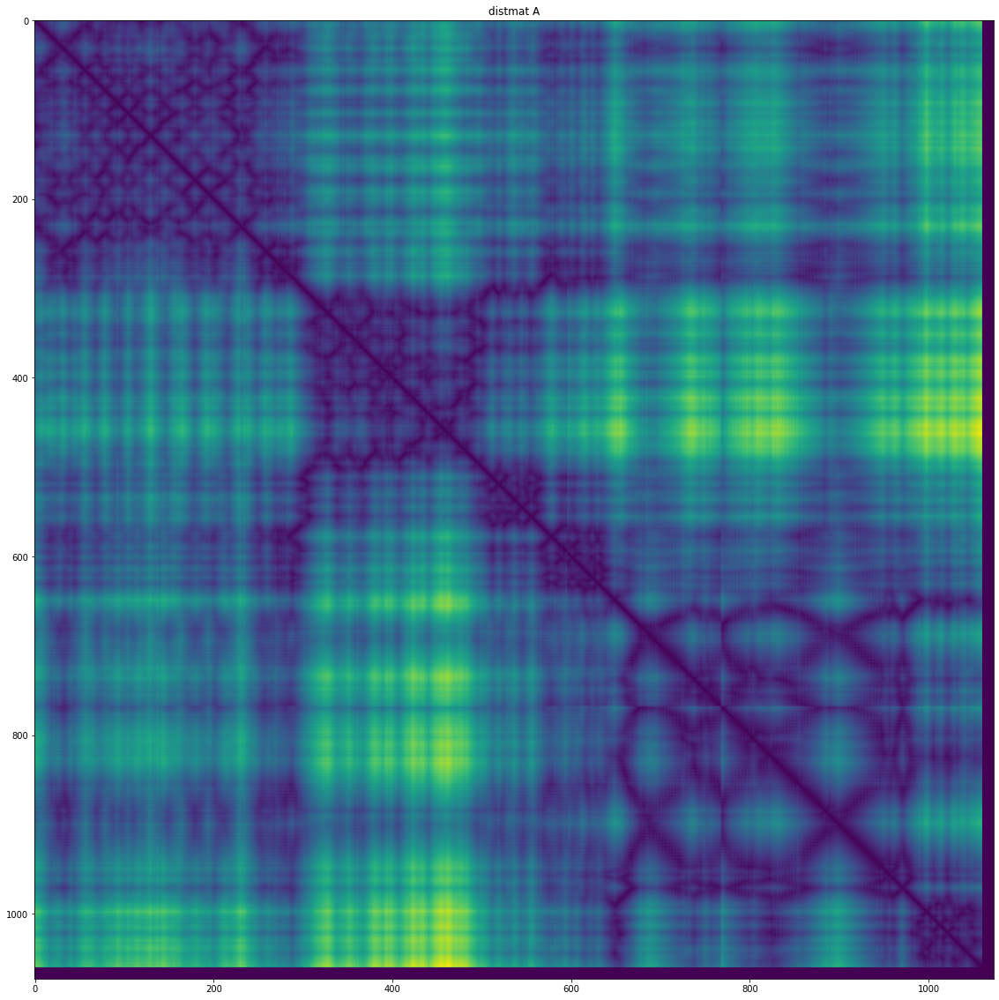

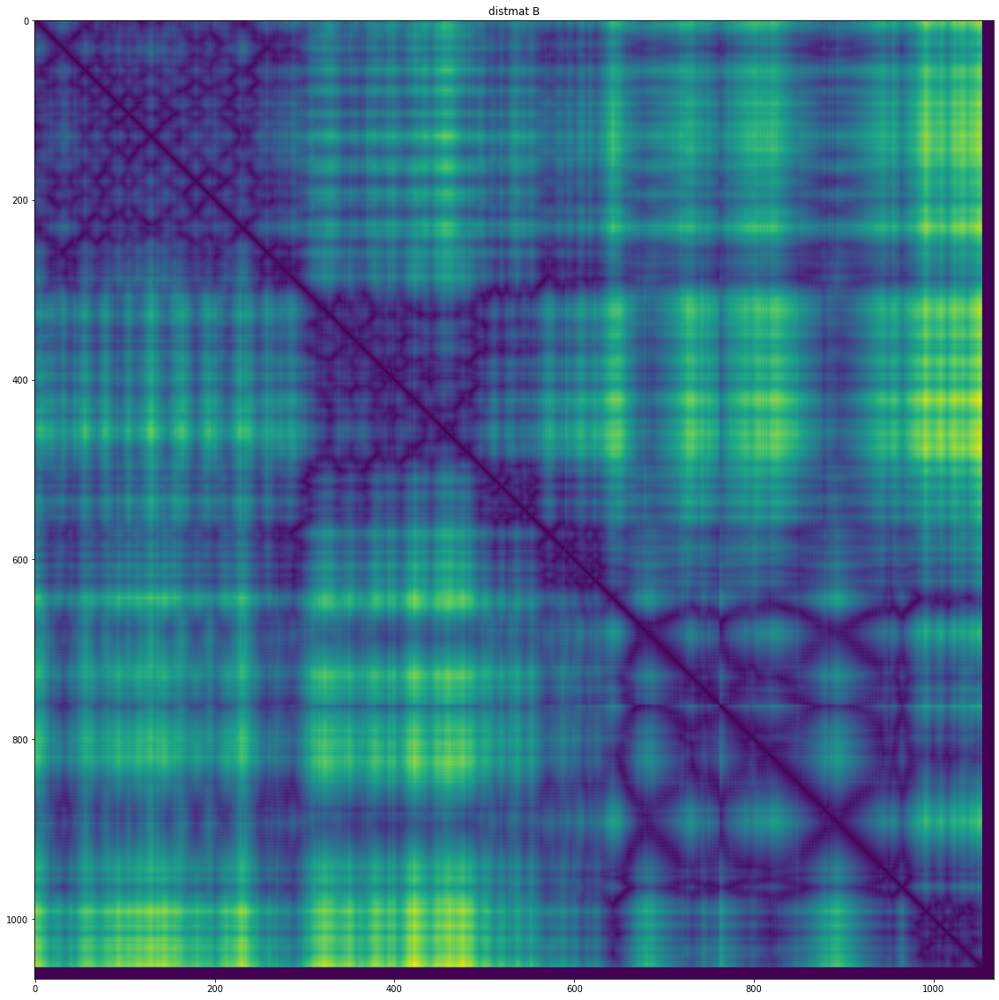

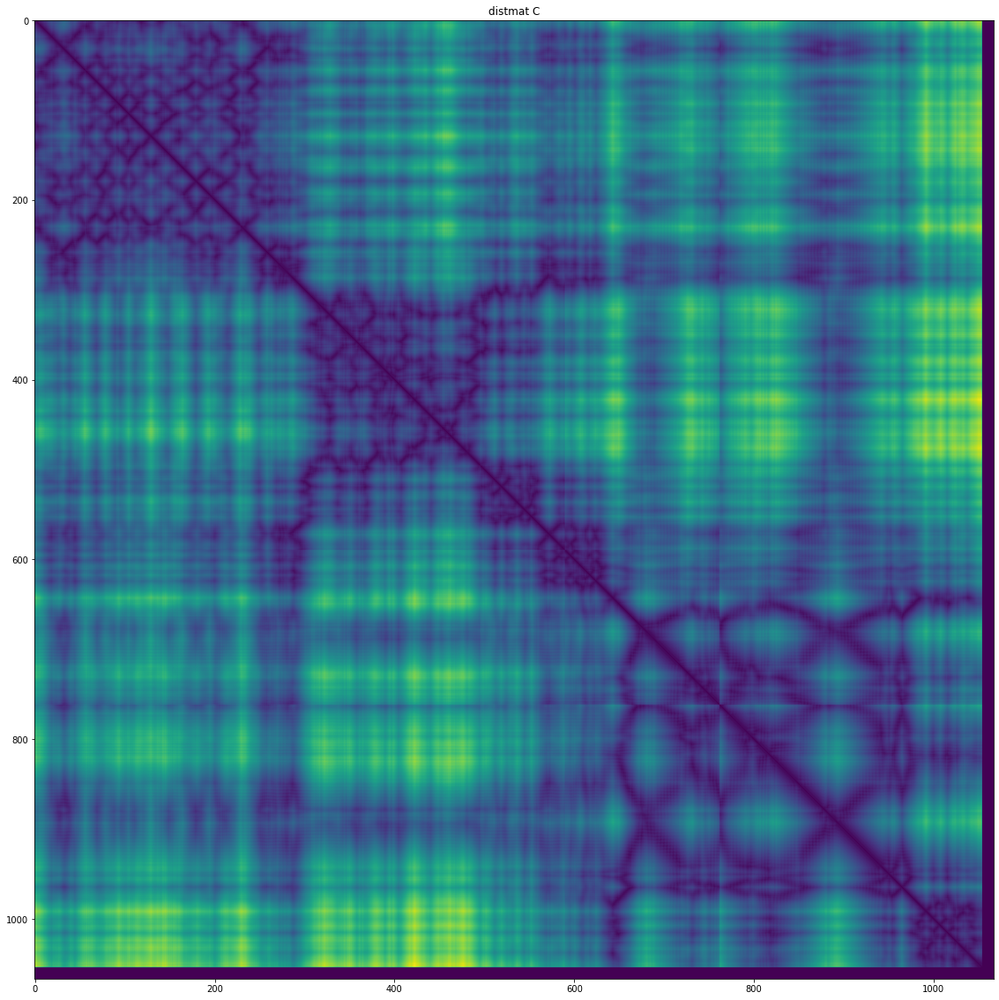

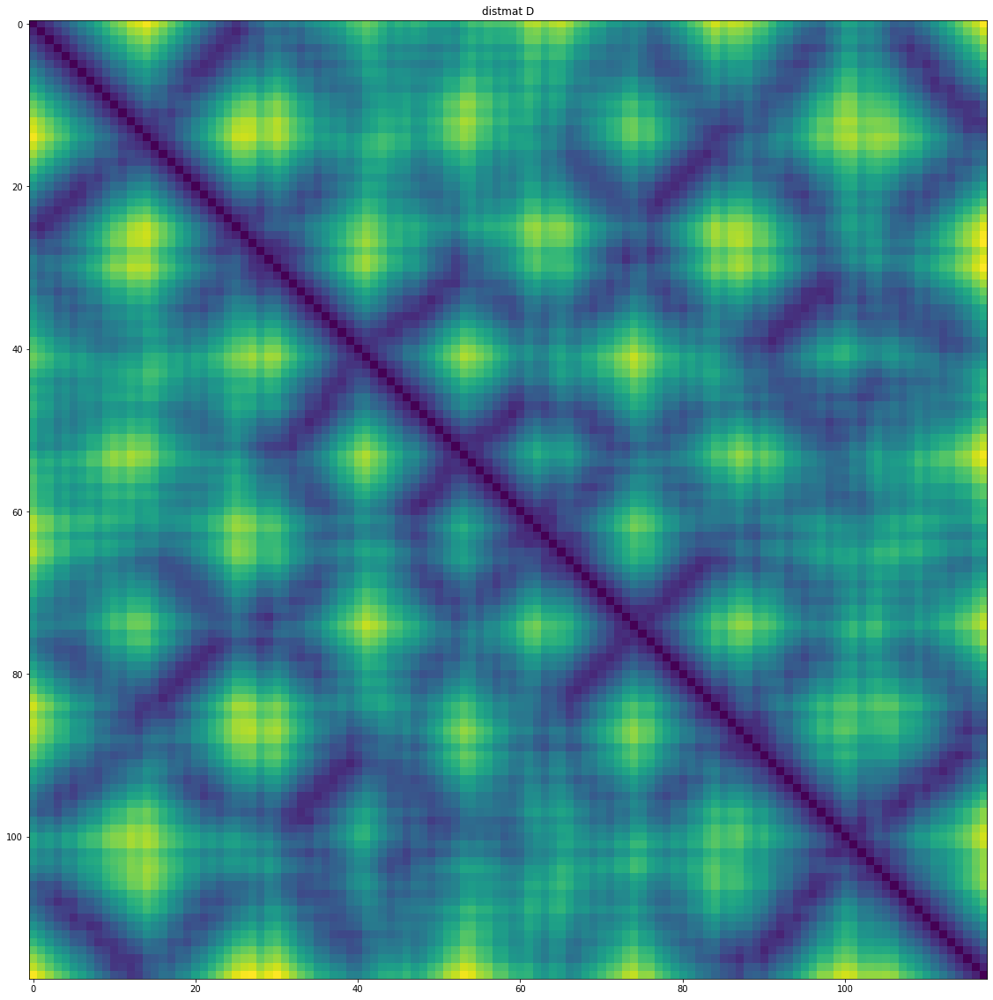

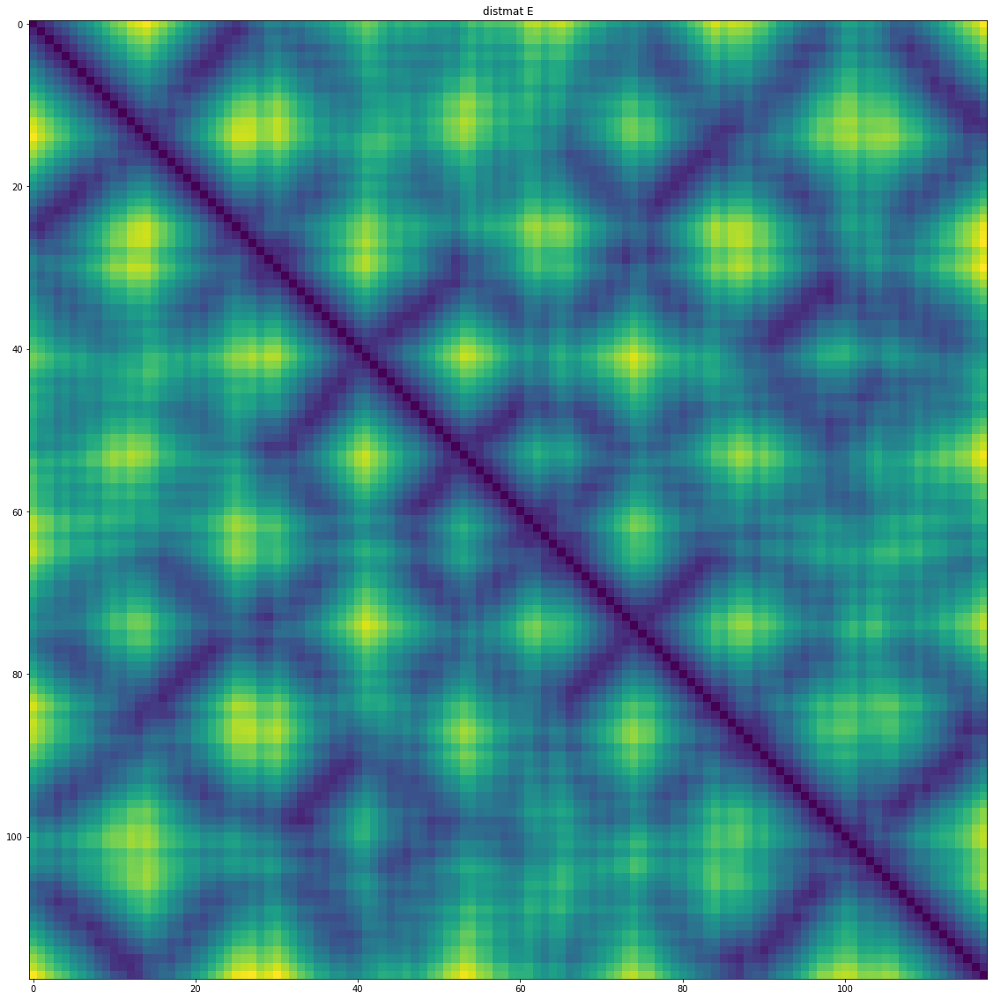

...

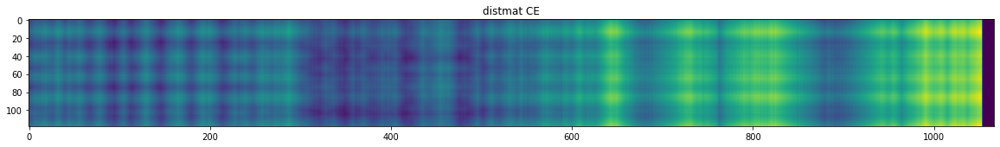

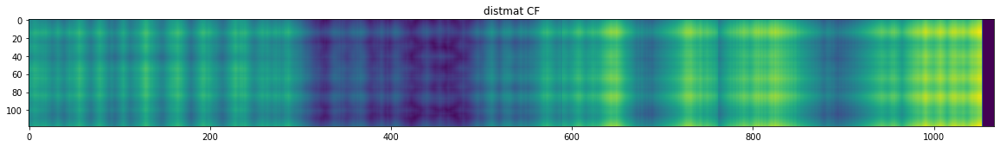

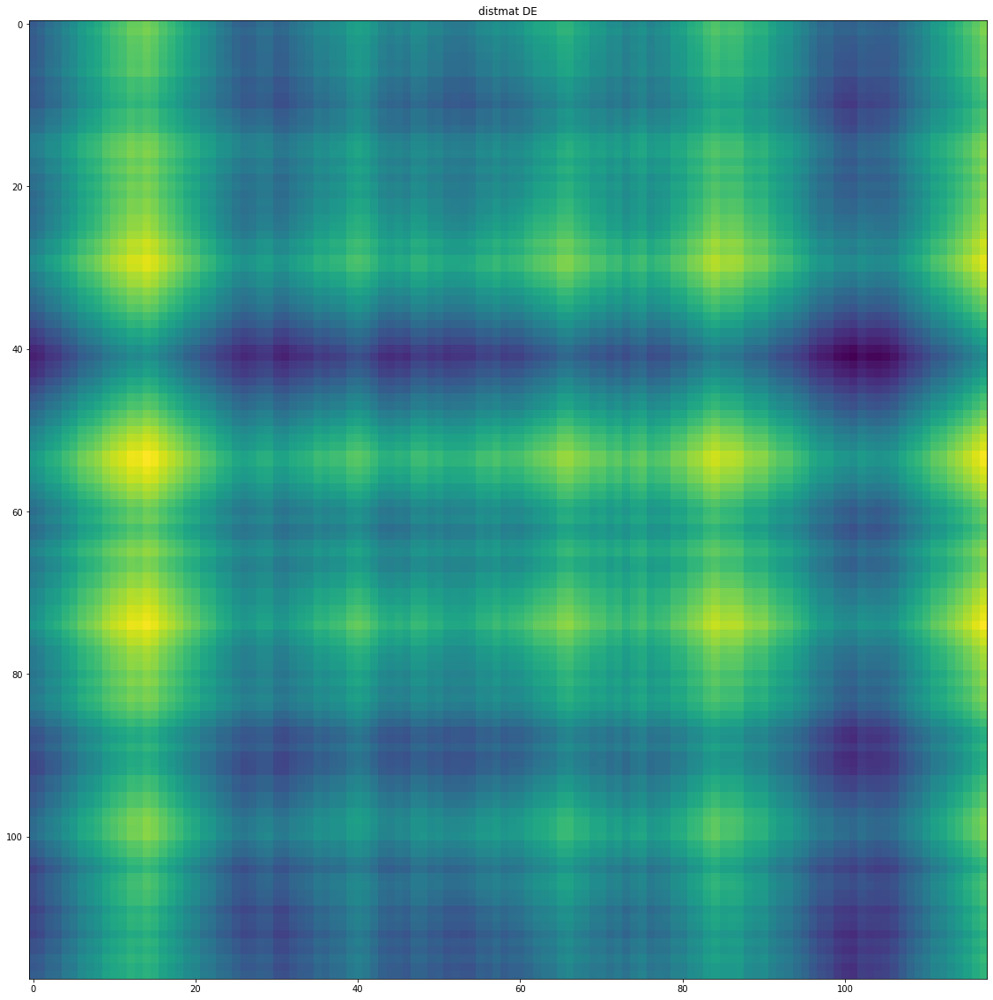

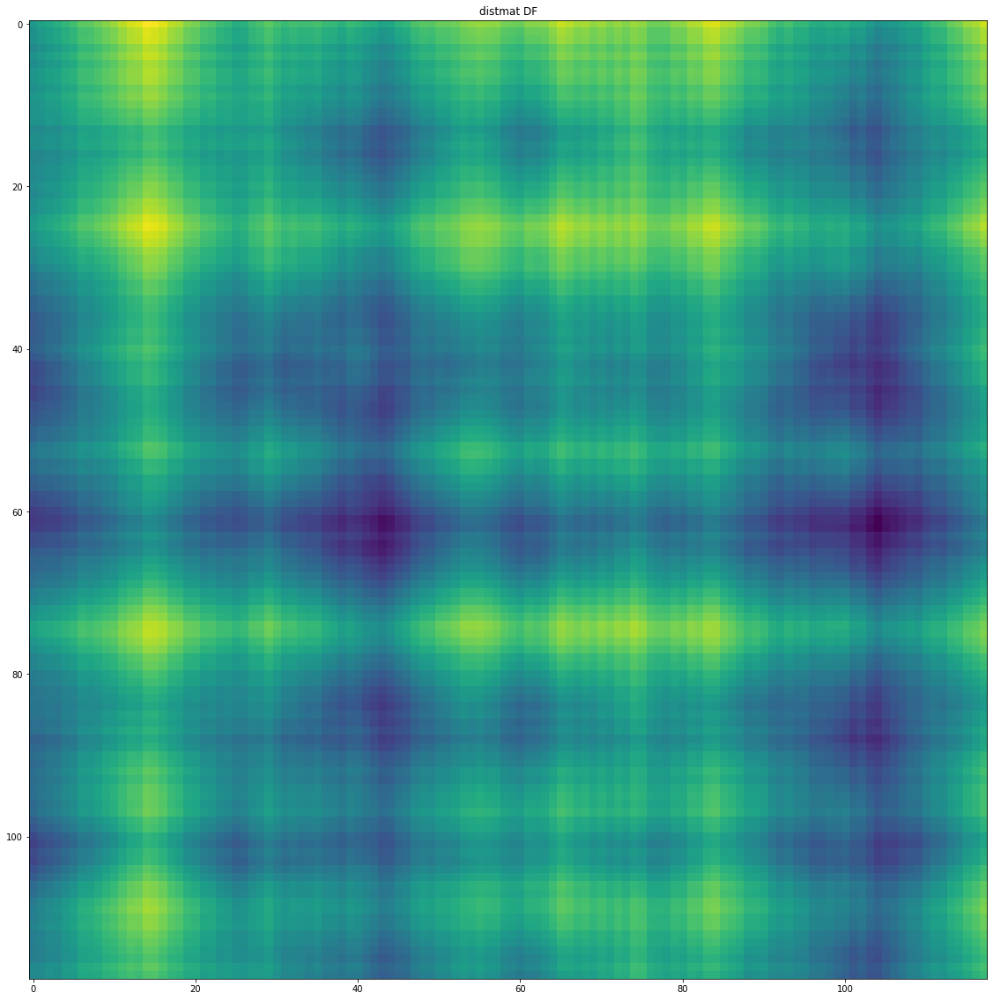

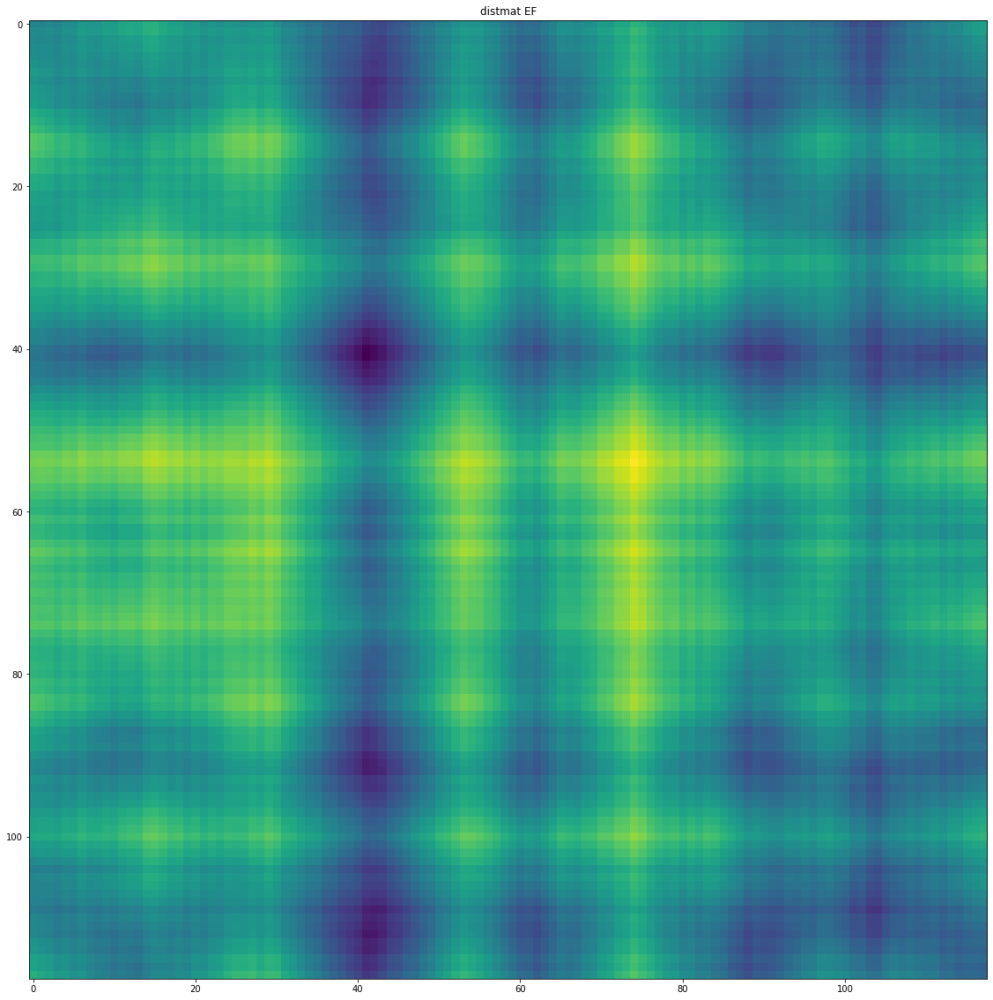

In [290]:
show_distmats = True
remove =[]
if show_distmats == True:
    for model in distmats:
        for i,chain in enumerate(distmats[model]):
            if distmats[model][chain].shape[0]>0:
                if np.sum(distmats[model][chain])==0:
                    remove.append((model,chain))
                else:
                    plt.figure(figsize= (20,20))
                    plt.title( 'distmat ' + ''.join(chain) )
                    plt.imshow(distmats[model][chain])
                    plt.show()
for model,chain in remove:
    del distmats[model][chain]

In [291]:
#find the amino acid chains in the structs
import subprocess
import shlex
import pandas as pd 
import numpy as np
#collapse codons
#use blastx to map to prot

seq = 'EPI_ISL_424471'
print('seq chosen: ' , seq)
#index all non gap cols
aln_row = align_array[IDindex[seq],:]
non_gap = [ i for i,c in enumerate(list(aln_row)) if c != b'-' ]

seq chosen:  EPI_ISL_424471


In [33]:
with open( templatedir + 'refgeno.fasta' , 'w' ) as fastout:
    fastout.write('>'+seq)
    fastout.write( ''.join( c.decode() for c in list(aln_row[non_gap]) ) )
qfile =  templatedir + 'refgeno.fasta'
#qfile =  './covid19/covid19_refgeno.fasta'

def runblastx( qseq , outannot = templatedir+'struct_blastout.txt' , db = templatedir + 'struct_chains.fasta' , outfmt = None ):
    if outfmt is None:
        outfmt = [ 'qseqid' , 'sseqid' , 'qlen' ,  'slen' , 'qstart' , 'qend' ,  'qframe' , 'evalue' ]
        outfmt =  ' "10 ' + ''.join([fmt+ ' ' for fmt in outfmt]) + ' " '
        print(outfmt)
    args = 'blastx -query '+ qfile + ' -db '+db+' -outfmt' + outfmt + ' -out ' + outannot  
    p = subprocess.run( shlex.split(args) )
    return p , outannot

p,annot = runblastx(qfile  )

seq chosen:  EPI_ISL_424471
 "10 qseqid sseqid qlen slen qstart qend qframe evalue  " 


OSError: [Errno 12] Cannot allocate memory

In [292]:
annotation = pd.read_csv( templatedir+'struct_blastout.txt' , header = None )
annotation.columns = [ 'qseqid' , 'sseqid' , 'qlen' ,  'slen' , 'qstart' , 'qend' ,  'qframe' , 'evalue' ] 
annotation = annotation[ annotation['evalue'] < 10**-3 ]
annotation['struct'] = annotation.sseqid.map( lambda x : x.split(':')[0] )
annotation['chain'] = annotation.sseqid.map( lambda x : x.split(':')[1] )
annotation.to_csv( alnfile +'struct_annotation.csv'  )
print(annotation)
#make annotation for dengue orfs
#find equivalent structures in multimers

         qseqid  sseqid   qlen  slen  qstart   qend  qframe        evalue  \
0   NC_045512.2  6zxn:A  29903  1060   21602  25000       2  0.000000e+00   
1   NC_045512.2  6zxn:C  29903  1054   21602  25000       2  0.000000e+00   
2   NC_045512.2  6zxn:B  29903  1054   21602  25000       2  0.000000e+00   
3   NC_045512.2  6vxx:C  29903   972   21641  25003       2  0.000000e+00   
4   NC_045512.2  6vxx:B  29903   972   21641  25003       2  0.000000e+00   
..          ...     ...    ...   ...     ...    ...     ...           ...   
86  NC_045512.2  1yo4:A  29903    87   27439  27687       1  4.270000e-46   
87  NC_045512.2  1ysy:A  29903    85   11840  12091       2  7.300000e-32   
88  NC_045512.2  3vc8:B  29903    85    9785  10042       2  2.010000e-28   
89  NC_045512.2  3vc8:A  29903    81    9785  10024       2  8.150000e-27   
90  NC_045512.2  6nur:C  29903    70   11846  12055       2  1.260000e-22   

   struct chain  
0    6zxn     A  
1    6zxn     C  
2    6zxn     B  
3  

In [293]:
annotation = annotation[annotation.struct == '6zxn']
print(annotation)

        qseqid  sseqid   qlen  slen  qstart   qend  qframe  evalue struct  \
0  NC_045512.2  6zxn:A  29903  1060   21602  25000       2     0.0   6zxn   
1  NC_045512.2  6zxn:C  29903  1054   21602  25000       2     0.0   6zxn   
2  NC_045512.2  6zxn:B  29903  1054   21602  25000       2     0.0   6zxn   

  chain  
0     A  
1     C  
2     B  


0.44014084507042256
0.8802816901408451
866.9999999999992


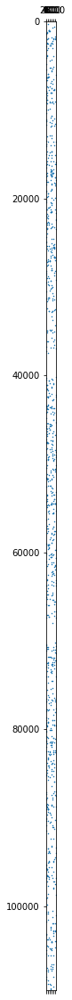

In [295]:
codon_dict = {}
slices = []
count =0
subAAmat = AAmat[:, non_gap]

#codonmat = np.zeros(( subAAmat.shape[0] , int(subAAmat.shape[1]/3) ) )

for i,r in annotation.iterrows():
    if (r.qstart-1, r.qend-1) not in slices:
        slices.append((r.qstart-1, r.qend-1))
        codonmat = np.zeros(( subAAmat.shape[0] , int((r.qend - r.qstart + 10 ) /3) ) )
        for j,codon in enumerate(range(r.qstart-1, r.qend-1 , 3 )):
            codon_dict[codon] = count
            cols = np.sum( subAAmat[:, codon:codon+2] , axis = 1 )
            codonmat[:,count] = cols.ravel()
            count+=1
            if count%500 == 0 and count >0:
                print(count/codonmat.shape[1])
print(np.sum(codonmat))

plt.figure(figsize=(20,20))
plt.spy(codonmat, markersize= .5)
plt.show()

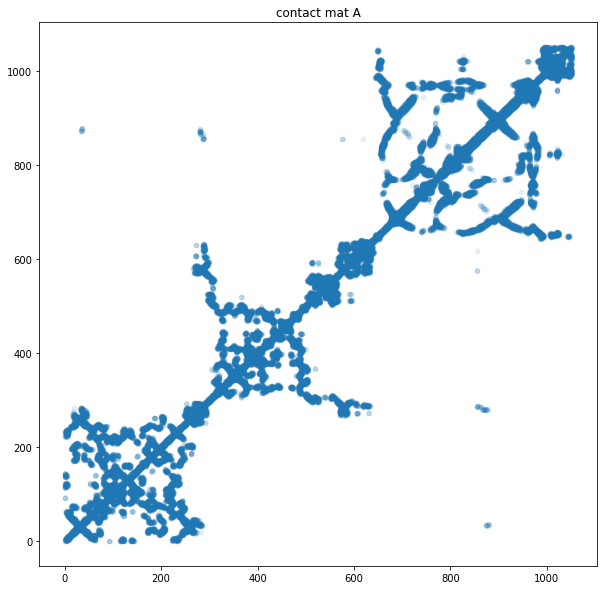

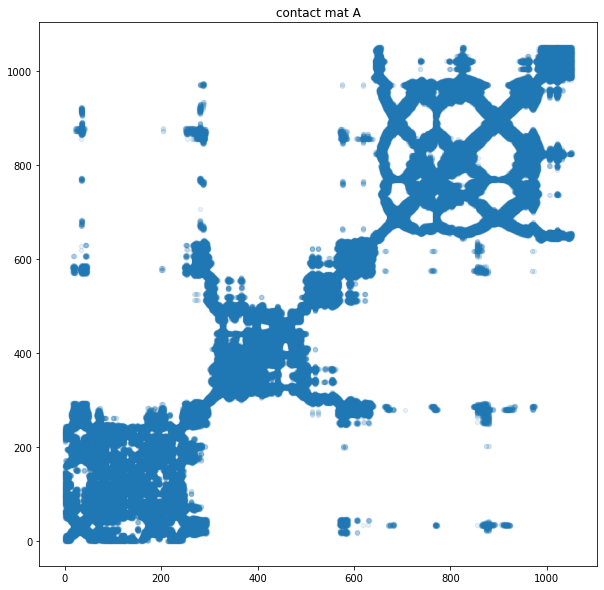

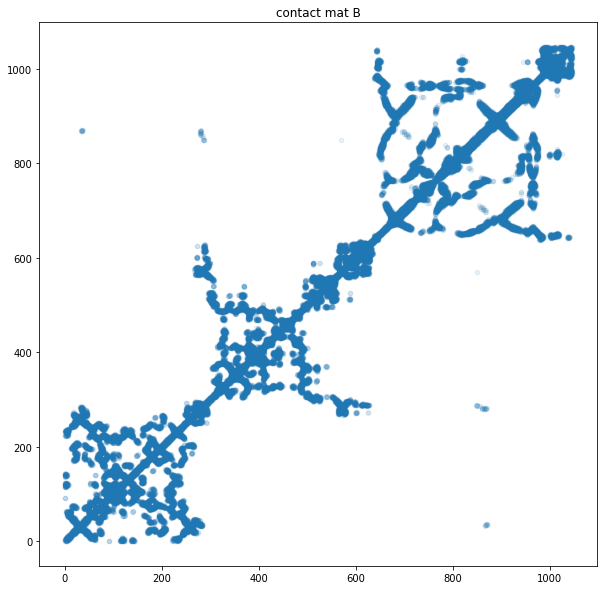

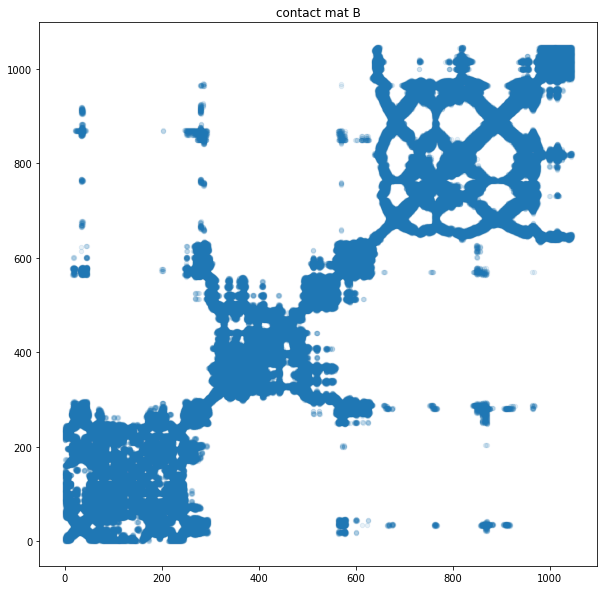

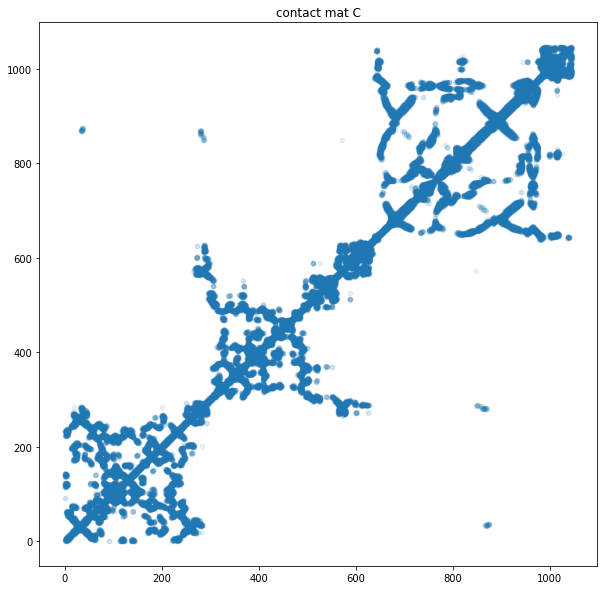

...

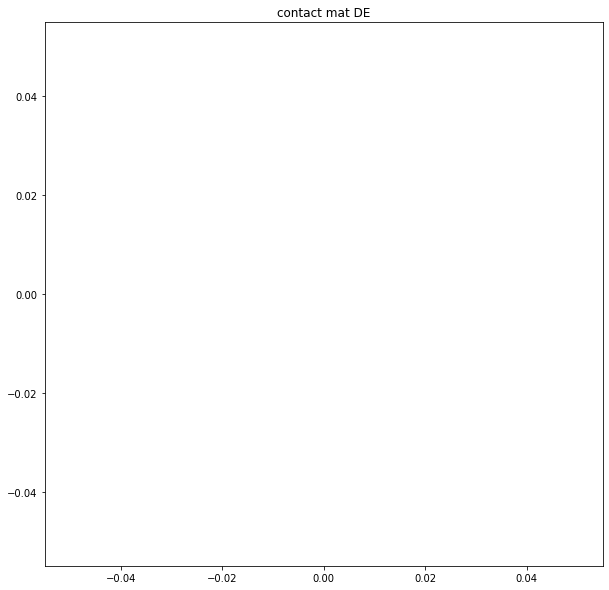

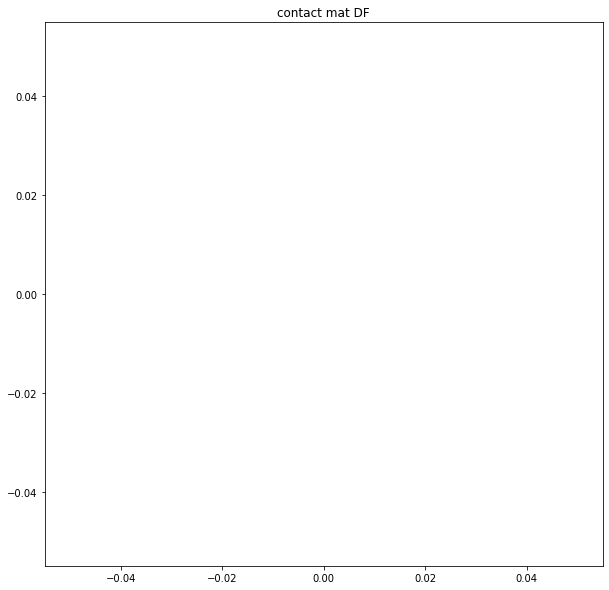

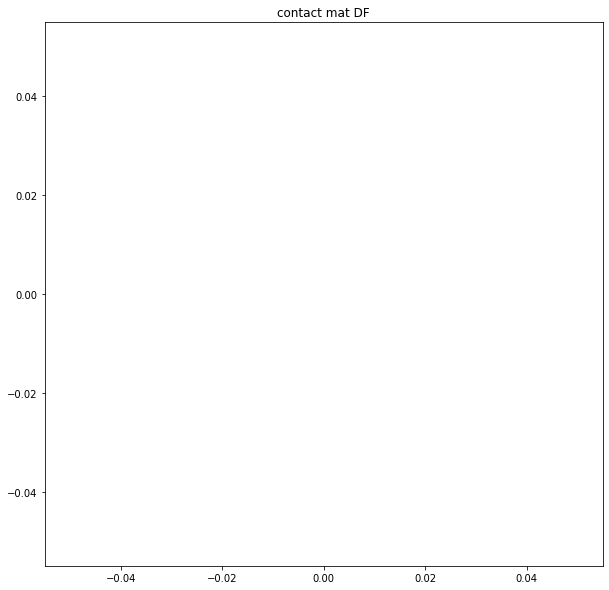

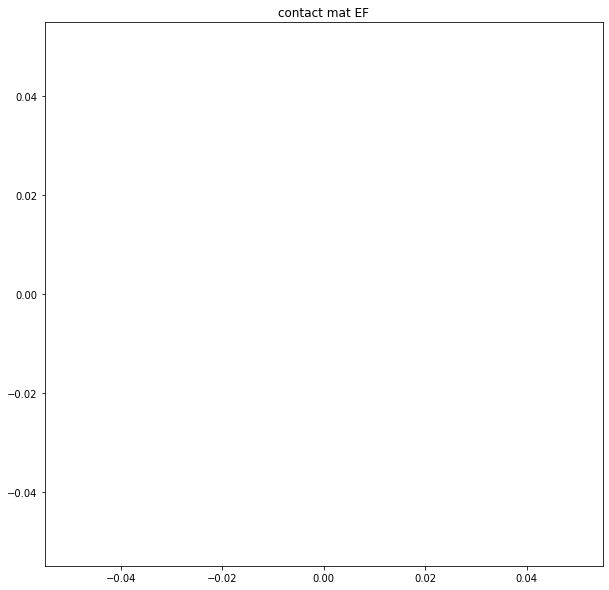

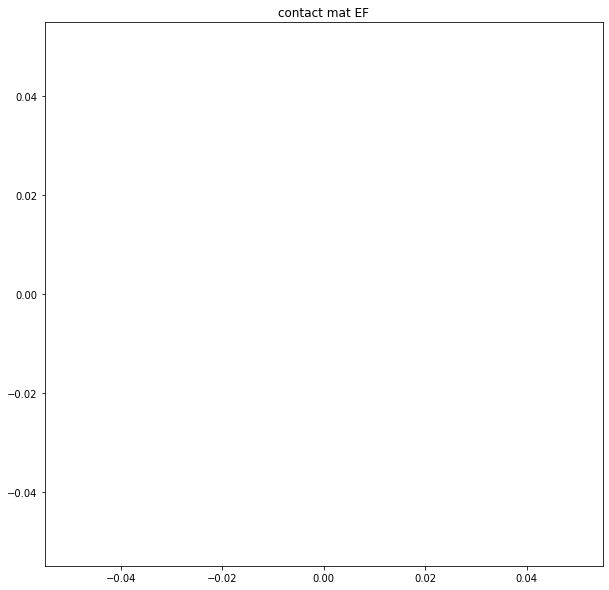

In [296]:
import copy
angstrom_cutoff = 15

def define_contacts(mat , angstrom_cutoff = 15 , dot = False ):
    subthresh = copy.deepcopy(mat)
    subthresh[ subthresh < angstrom_cutoff ] = 1 
    subthresh[ subthresh > angstrom_cutoff ] = 0 
    np.fill_diagonal(subthresh , 0)
    subthresh = subthresh[0:subthresh.shape[0]-20,0:subthresh.shape[1]-20]
    
    if dot == True:
        connected = np.dot(subthresh,subthresh.T)
        return subthresh,connected
    else :
        return subthresh
#connnectedx , connectedy  = (np.nonzero(connected)[0] ,np.nonzero(connected)[1])

subthresh_mats ={}
chain_equivalencies={}
show_contacts = True


for struct in distmats:
    for chain in distmats[struct]:
        if struct not in subthresh_mats:
            subthresh_mats[struct]={}
        subthresh, connected = define_contacts(distmats[struct][chain] , angstrom_cutoff , dot = True )
        if show_contacts == True:
            plt.figure(figsize=(10,10) )
            plt.title('contact mat '+ ''.join(chain) )
            plt.scatter( np.nonzero(subthresh)[0] ,np.nonzero(subthresh)[1]  , marker= 'o' , alpha = .1 ,  s = 20)
            plt.show()
            
            plt.figure(figsize=(10,10) )
            plt.title('contact mat '+ ''.join(chain) )
            plt.scatter( np.nonzero(connected)[0] ,np.nonzero(connected)[1]  , marker= 'o' , alpha = .1 ,  s = 20)
            plt.show()
        subthresh_mats[struct][chain] = { 'thresh':subthresh , 'connected' : connected}





In [297]:
from sklearn.manifold import Isomap , MDS , locally_linear_embedding ,SpectralEmbedding
from sklearn.preprocessing import StandardScaler
from sklearn.cluster import MiniBatchKMeans , DBSCAN ,SpectralClustering ,OPTICS , AgglomerativeClustering
import sklearn

In [199]:
def return_clustering(codonmat, calc_isomap = True , scale = True , dbscan = False , xi = 0.035 , samples = 5 , jaccard = True , reductionfactor= .75 ,clustiter =0):
    
    
    
    if scale == True:
        scaler = sklearn.preprocessing.RobustScaler( )
        codonmat = scaler.fit_transform(codonmat.T).T
    if calc_isomap == True:
        print('isomap')
        try:
            #isomap = Isomap( n_neighbors= 5 , n_components= int(codonmat.shape[0]*reductionfactor) , eigen_solver='auto', tol=0.1 , 
            #   max_iter=None, path_method='auto', neighbors_algorithm='auto', n_jobs=-1 )
            isomap = sklearn.manifold.locally_linear_embedding(n_neighbors=25,n_components= int(codonmat.shape[0]/clustiter) )
            #isomap=SpectralEmbedding(n_components= int(codonmat.shape[0]*reductionfactor) , n_jobs=-1)
            #codonmat = isomap.fit_transform( X=codonmat.T ).T
        except:
            pass
    
    print(clustiter)
    if calc_isomap == False:
        print('kmeans')
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            #apb = DBSCAN(eps=0.5, min_samples=5,  metric='minkowski', p=1.5 , metric_params=None, algorithm='auto', leaf_size=30, n_jobs=-1)
            #apb = OPTICS(min_samples=samples, metric='minkowski', p=1.5, metric_params=None, cluster_method='xi', eps=None, xi=xi, predecessor_correction=True, min_cluster_size=2 , algorithm='auto', leaf_size=20, n_jobs=-1)
            apb = MiniBatchKMeans(n_clusters= 100 )
            cluster_labels_codon = apb.fit_predict(codonmat.T ) 
            cluster_labels_codon[ np.sum(codonmat , axis = 0 ).flat == 0 ] = -1
    else:
        print('optics')
        with warnings.catch_warnings():
            warnings.simplefilter("ignore")
            apb = OPTICS(min_samples=samples, metric='minkowski', p=1.5, metric_params=None, cluster_method='xi', eps=None, xi=xi, predecessor_correction=True, min_cluster_size=2 , algorithm='auto', leaf_size=20, n_jobs=-1)
            #apb = DBSCAN(eps=0.5, min_samples=5,  metric='minkowski', p=1.5 , metric_params=None, algorithm='auto', leaf_size=30, n_jobs=-1)            #apb = OPTICS(min_samples=samples, metric='minkowski', p=1.5 , metric_params=None, cluster_method='xi', eps=None, xi=xi, predecessor_correction=True, min_cluster_size=2 , algorithm='auto', leaf_size=20, n_jobs=-1)
            #apb = MiniBatchKMeans(n_clusters= 10 )
            cluster_labels_codon = apb.fit_predict(codonmat.T.toarray()  )
    
    return cluster_labels_codon

def subcluster( mat , cluster_thresh=10 , indices = None  ,  iter_thresh = 5 , clusterlevel = 'head' , clustiter =0, calc_isomap = False , scale = True , xi = .035 , samples = 5 , verbose = True , jaccard = False  ):
    #break a large cluster into smaller subclusters until avg cluster size is below thresh
    if verbose == True:
        print('clustering' , clusterlevel)
    
    
    
    cluster_labels = return_clustering(mat, calc_isomap=calc_isomap  , scale=scale  , dbscan=dbscan  ,xi = xi , samples = samples , jaccard = jaccard ,clustiter =clustiter +1)
    
    if verbose == True:
        print('DONE clustering ', clusterlevel)
    
    indices = np.arange(mat.shape[1])
    l,c = np.unique(cluster_labels, return_counts= True)
    if len(l) == 1:
        xi += .01
        if verbose == True:
            print(l)
            print('xi',xi)
    if verbose == True:
        print('l',l)
        print('c',c)
    clustering = {  'labels': cluster_labels , 'sub':{} , 'mappings':{} , 'mappings_rev':{} , 'newindex':{} }
    #if we're over the max recursion
    kmeans = False
    if clustiter < iter_thresh:
        for i,label in enumerate(list(l)):
            for colcount,index in enumerate(list(indices[cluster_labels == label])):
                clustering['mappings_rev'][index] = label
                clustering['newindex'][index]= colcount
            
            clustering['mappings'][label] = indices[cluster_labels == label]
            if c[i] > cluster_thresh:
                if verbose == True:
                    print( 'reclustring',label , c[i] )
                    print( 'min samples' , samples )
                #isomap within clusters                
                #don't split up clusters formed from columns with no events
                if np.amax(mat[:,cluster_labels==label])> 0 :
                    clustering['sub'][label] = subcluster( mat[:,cluster_labels==label] , cluster_thresh =cluster_thresh ,indices= clustering['mappings'][label] , iter_thresh = iter_thresh , clusterlevel= str(label)+'_'+str(clustiter), samples = samples,  clustiter = clustiter + 1 , calc_isomap = True , jaccard = True ,  xi= xi , scale = scale  )
                    samples = max( 2 , samples-1 )
    return clustering

In [ ]:
def return_sub(indict, level= 0 ):
    l,c = np.unique(indict['labels'] , return_counts= True)
    print(level)
    print(l)
    for clust in list(l):
        if clust != -1:
            if 'sub' not in indict or clust not in indict['sub']:
                    yield (indict['mappings'][clust],level)
            else:
                print('deeper')
                print(level)
                return_sub( indict['sub'][clust], level = level +1 )
            

def divide_clusters( subclustering_dict , cols ):
    #only go down one level for now
    cluster_dict={}
    count =0
    total_labels = np.ones((cols,))*-1
    labelset = set([])
    for mapping in return_sub(subclustering_dict):
        print(mapping, count)
        
        total_labels[mapping] = count
        count += 1
    return total_labels
    #setup sublcluster dictionary
'''
def return_sub(indict, col, level= 0 ):
    clust = int(indict['labels'][col])
    if level == 0 and clust == -1:
        return(-1,0)
    if 'sub' not in indict or clust not in indict['sub']:
        return (clust,level)
    else:
        return return_sub( indict['sub'][clust] , indict['newindex'][col] , level = level +1 )
       
def divide_clusters( subclustering_dict , cols ):
    #only go down one level for now
    count =0
    total_labels = np.ones((cols,))*-1
    labelset = {(-1,0):-1}
    for col in range(cols):
        ret = return_sub(subclustering_dict,col)
        mapping,level = ret
        if  (mapping,level) not in labelset:
            labelset[(mapping,level) ] = count
            label = count
            count +=1
        else:
            label = labelset[(mapping,level)]
        total_labels[col] = label
    return total_labels
    #setup sublcluster dictionary

'''

In [155]:
def check_point(contactsx , contactsy, ptx,pty, radius = 10 , verbose = False):
    #find non zero contact pts
    for center_x, center_y, in zip(contactsx,contactsy):
        if (ptx - center_x)**2 + (pty - center_y)**2 < radius**2:
            if verbose == True:
                print(ptx,pty,center_x, center_y)
                print('left', (ptx - center_x)**2 + (pty - center_y)**2 )
                print( 'right', radius**2 )
                
            return True
    return False


In [156]:
#calculate clustering using recursive optics and isomap
verbose = True
show_intra_clust_dist = False
show_hits = True 
show_mat = False

import itertools
from scipy.stats import gumbel_l
#connected = np.dot(subthresh,subthresh)
#connnectedx , connectedy  = (np.nonzero(connected)[0] ,np.nonzero(connected)[1])
#globalmat_blur_thresh = copy.deepcopy(globalmat_blur)
#globalmat_blur_thresh[ globalmat_blur_thresh < 20 ] = 0

#for blur iter in blur
#count the number of green / orange / red
maxiter = 20
blurs = []

increment = 100
blurs = 0
blurvec =[0]
lastreds = 100
totalreds = [0]
totalgreens = [0]
totaloranges = [0]
shuffle_iter = 1000

hits ={}
#find within cluster eval for a pair 
import random

In [87]:
globalmat = codonmat

In [259]:
def struct_hits( cluster_labels , distmats , struct , chain , l , c , verbose = False , radius = 10):
    
    color = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)]) for k in range(len(l))   ]
    
    subthresh = distmats[struct][chain]['thresh']
    
    #subthresh += distmats[struct][('A','C')]['thresh']
    
    if 'connected' in distmats[struct][chain]:
        connected = distmats[struct][chain]['connected']
        chain1 = chain
        chain2 = chain
    else: 
        connected = None
        chain1 = chain[0]
        chain2 = chain[1]

    plt.figure(figsize=(20,20) )
    for i,label in enumerate(list(l.flat)):
        if c[i]< 15 and c[i]>1 : 
            zeroed = np.where(cluster_labels == label )[0]
            if len(list(zeroed))>2:
                #all combos
                nz_pts = [ ( ptx, pty ) for ptx,pty in itertools.combinations(list(zeroed) , 2 ) ]

                plt.scatter( nz_pts[0] , nz_pts[1] , c= color[i] , marker= 'X', s=100)
                plt.scatter( nz_pts[1], nz_pts[0] , c= color[i] , marker= 'X' , s=100)
               

    plt.scatter( np.nonzero(subthresh)[0] ,np.nonzero(subthresh)[1]  , marker= 'o' , alpha = .1,  s = 50)
    plt.show()
    
    
    
    
    plt.figure(figsize=(20,20) )
    #red and green plt

    reds =[]
    oranges=[]
    greens =[]

    for i,label in enumerate(list(l.flat)):
        if c[i]< 15 and c[i]>1 :
            mask = copy.deepcopy(subthresh)
            zeroed = np.where(cluster_labels == label )[0]
            if len(list(zeroed))>2:
                #change here for offset
                nz_pts = [ ( ptx, pty ) for ptx,pty in itertools.combinations(list(zeroed) , 2 ) ]
                
                green = np.array([ check_point(list(np.nonzero(subthresh)[0]) , list(np.nonzero(subthresh)[1]), ptx , pty,radius = radius )  for ptx,pty in  nz_pts ])
                if len(green)>0:
                    if connected is not None:
                        orange = np.array(  [ check_point(list(np.nonzero(connected)[0]) , list(np.nonzero(connected)[1]), ptx , pty,radius = radius )  for ptx,pty in nz_pts ]   )
                        orange[ np.logical_and( green , orange ) ] = False
                    red = copy.deepcopy(green)
                    if len(red)>0:
                        red = ~red
                        if connected is not None:
                            red[orange == True] = False
                    
                    ones = np.ones((len(nz_pts),))
                    if len(red)==0:
                        reds.append(0)
                    else:
                        reds.append(np.sum(ones[red]))
                    if connected is not None:
                        oranges.append(np.sum(ones[orange]))
                    else:
                        oranges.append(0)
                    
                    greens.append(np.sum(ones[green]))
                    #pts = np.array( [[ptx,pty] for ptx,pty in  itertools.combinations(list(zeroed) ,2) ] )
                    nz_pts = np.array(nz_pts)
                    plt.scatter( nz_pts[green,0] ,nz_pts[green,1], c= 'green' , marker= 'X', s=100)
                    plt.scatter( nz_pts[green,1] ,nz_pts[green,0], c= 'green' , marker= 'X', s=100)

                    plt.scatter( nz_pts[red,0] ,nz_pts[red,1] , c= 'red' , marker= 'X' , s=100)
                    plt.scatter( nz_pts[red,1] ,nz_pts[red,0] , c= 'red' , marker= 'X' , s=100)
                    
                    if connected is not None:
                        plt.scatter( nz_pts[orange,1] ,nz_pts[orange,0], c= 'orange' , marker= 'X', s=100)
                        plt.scatter( nz_pts[orange,0] ,nz_pts[orange,1], c= 'orange' , marker= 'X', s=100)      
    
    plt.scatter( np.nonzero(subthresh)[0] ,np.nonzero(subthresh)[1]  , marker= 'o' , alpha = .01,  s = 50)
    plt.show()
    return green, oranges, reds

In [70]:
globalmat = codonmat

In [250]:
blurfactor = .01
for bluriteration in [150 ]:
    mat = scipy.sparse.csc_matrix(copy.deepcopy(globalmat))
    print('blurring')
    for k in range(int( bluriteration ) ):
        if k%10 == 0 or k < 5:
            print(k)
        mat += blurfactor*connectmat.dot(mat)
        #mat += np.dot(blurfactor*connectmat, mat )
    print(' done blurs',bluriteration ) 

blurring
0
1
2
3
4
10
20
30
40
50
60
70
80
90
100
110
120
130
140
 done blurs 150


In [251]:
print('recursive clustering')
np.random.seed(0)
clusterdict = subcluster( mat , calc_isomap= False , jaccard = False,  scale = False )
#print(clusterdict)

print('done')

recursive clustering
clustering head
1
kmeans
DONE clustering  head
l [-1  0  1  2  3  4  5  6  7  9 10 12 14 15 17 18 19 20 21 23 24 25 28 29
 30 32 33 34 35 37 38 42 43 44 45 48 49 50 51 52 55 57 58 60 61 62 64 65
 66 67 69 70 71 72 73 75 80 81 82 83 84 85 86 92 97]
c [765 160   1   1   1   1   9   1 136   1   1   1   1   1   1   1   1   1
   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1
   2   1   1   1   1   1   1   1   2   1   1   2   1   1   1   1   1   1
   1   1   1   1   1   1   1   2   2   1   1]
reclustring -1 765
min samples 5
reclustring 0 160
min samples 5
clustering 0_0
isomap
2
optics
DONE clustering  0_0
l [-1  0]
c [148  12]
reclustring -1 148
min samples 5
clustering -1_1
isomap
3
optics
DONE clustering  -1_1
l [-1  0]
c [124  24]
reclustring -1 124
min samples 5
clustering -1_2
isomap
4
optics
DONE clustering  -1_2
l [-1  0]
c [37 87]
reclustring -1 37
min samples 5
clustering -1_3
isomap
5
optics
DONE clustering  -1_3
l [-1  0]
c [27 10]
rec

In [257]:
#czuuzluster_labels[ np.sum(mat , axis = 0 ).flat == 0 ] = -1

cluster_labels = divide_clusters( clusterdict  , mat.shape[1])
l,c = np.unique(cluster_labels, return_counts= True)
color = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)]) for k in range(len(l))   ]
print('labels' , l )
print('counts' , c )

labels [-1.  0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16.
 17. 18. 19. 20. 21. 22. 23. 24. 25. 26. 27. 28. 29. 30. 31. 32. 33. 34.
 35. 36. 37. 38. 39. 40. 41. 42. 43. 44. 45. 46. 47. 48. 49. 50. 51. 52.
 53. 54. 55. 56. 57. 58. 59. 60. 61. 62. 63.]
counts [765 286   2   1   2  10   9   1   1   1   1   1   1   1   1   1   1   1
   1   1   1   1   2   1   2   1   1   1   1   1   1   1   1   1   1   1
   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1
   1   1   1   1   1   1   1   2   1   1   1]


In [ ]:
import pickle
with open('clusterout.pkl', 'wb') as clustering_res:
    clustering_res.write(pickle.dumps(cluster_labels))


In [260]:
#add the uinformative columns to -1

l,c = np.unique(cluster_labels, return_counts= True)
color = ["#"+''.join([random.choice('0123456789ABCDEF') for j in range(6)]) for k in range(len(l))   ]
print('labels' , l )
print('counts' , c )
if show_intra_clust_dist == True:
    for i,label in enumerate(list(l.flat)):
        if i < 10:
            if c[i]< 20 and c[i]>2:
                print('intracluster dists: ' , label)
                zeroed = np.where(cluster_labels == label )[0]
                print(zeroed)
                combos =  [ c for c in itertools.combinations(list(zeroed) , 2)]                        
                if verbose == True:

                    plt.figure(figsize=(30,10))
                    plt.imshow(mat[:,zeroed])
                    plt.show()

                    plt.figure(figsize=(30,10))
                    plt.spy(mat[:,zeroed])    
                    plt.show()

                if len(combos)>3:
                    print(combos)
                    scrambled = []
                    distances = []
                    for combo in combos:
                        #find intracluster distances 
                        c1 = copy.deepcopy(mat[:,combo[0]])
                        c2 = copy.deepcopy(mat[:,combo[1]])
                        dist = scipy.spatial.distance.euclidean(c1, c2 )
                        c1_scramble = copy.deepcopy(mat[:,combo[0]])
                        c2_scramble = copy.deepcopy(mat[:,combo[1]])
                        distances.append( dist )
                        for shuffle in range(shuffleiter):
                            np.random.shuffle(c1_scramble)
                            np.random.shuffle(c2_scramble)
                            dist = scipy.spatial.distance.euclidean(c1_scramble, c2_scramble  )
                            scrambled.append( dist )
                    #fit gumbel

                    #cutoff w p val


                    scrambled = np.array(scrambled)
                    distances = np.array(distances)

                    #add pval cutoff
                    plt.vlines()
                    plt.hist(scrambled , label = 'scrambled' , alpha = .5, density=True)
                    plt.hist(distances, label = 'coev' ,  alpha = .5, density=True)
                    plt.legend()
                    plt.title('cluster'+str(label))
                    plt.show()

if show_mat == True:
    plt.figure(figsize=(45,100))
    for i,label in enumerate(list(l.flat)):
        mask = copy.deepcopy(globalmat)
        #mask = mask[:,non_gap]
        mask[:, label!=cluster_labels ] =0
        plt.spy(mask, markersize= .5 ,c=color[i] )
    plt.show()

print(subthresh_mats['6zxn'].keys())
if show_hits == True:
    #start with intra
    for struct in subthresh_mats:
        print(struct)
        if struct not in hits:
            hits[struct] = {}
        for chain in subthresh_mats[struct]:
            print(chain)
            if chain not in hits:
                hits[struct][chain] = {}
            print('calculating hits for chain, struct, blurs')
            print( chain, struct , bluriteration)
            reds, oranges, greens = struct_hits( cluster_labels=cluster_labels , distmats=subthresh_mats , struct=struct , chain=chain , l=l , c=c )
            hits[struct][chain][bluriteration]={'reds':reds ,'oranges':oranges , 'greens':greens}

labels [-1.  0.  1.  2.  3.  4.  5.  6.  7.  8.  9. 10. 11. 12. 13. 14. 15. 16.
 17. 18. 19. 20. 21. 22. 23. 24. 25. 26. 27. 28. 29. 30. 31. 32. 33. 34.
 35. 36. 37. 38. 39. 40. 41. 42. 43. 44. 45. 46. 47. 48. 49. 50. 51. 52.
 53. 54. 55. 56. 57. 58. 59. 60. 61. 62. 63.]
counts [765 286   2   1   2  10   9   1   1   1   1   1   1   1   1   1   1   1
   1   1   1   1   2   1   2   1   1   1   1   1   1   1   1   1   1   1
   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1   1
   1   1   1   1   1   1   1   2   1   1   1]
dict_keys(['A', 'B', 'C', 'D', 'E', 'F', ('A', 'B'), ('A', 'C'), ('A', 'D'), ('A', 'E'), ('A', 'F'), ('B', 'C'), ('B', 'D'), ('B', 'E'), ('B', 'F'), ('C', 'D'), ('C', 'E'), ('C', 'F'), ('D', 'E'), ('D', 'F'), ('E', 'F')])
6zxn
A
calculating hits for chain, struct, blurs
A 6zxn 150


ValueError: operands could not be broadcast together with shapes (1053,1053) (1047,1053) (1053,1053) 

<ipython-input-185-20bbc25f6f1a>:1: RuntimeWarning: invalid value encountered in true_divide
  green2red = np.divide( np.array(totalgreens) , np.array(totalreds)+np.array(totalgreens ) )


ValueError: x and y must have same first dimension, but have shapes (18,) and (0,)

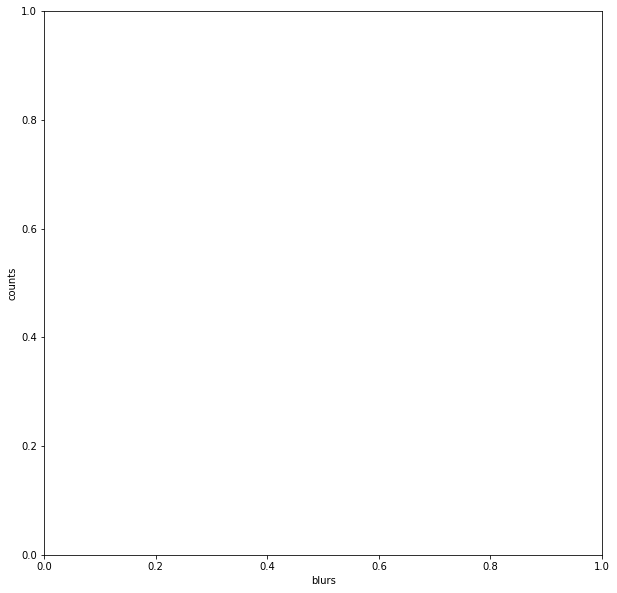

In [185]:

green2red = np.divide( np.array(totalgreens) , np.array(totalreds)+np.array(totalgreens ) )

bluriters = [1,5,10,20,30,40,50,60, 70 ,80 , 90, 100 ]+[100,110,120,130,140,150 ]

fig, ax1 = plt.subplots( figsize=(10,10))

ax1.set_xlabel('blurs')
ax1.set_ylabel('counts', color='black')
ax1.plot( bluriters,  totalgreens[1:] , color='green' , label= 'greens')
ax1.plot(bluriters,  totalreds[1:] , color='red', label = 'reds')
ax1.plot(bluriters, totaloranges[1:] , color='orange', label = 'oranges')

positives = np.array(totaloranges[1:]) + np.array(totalgreens[1:])
ax1.plot(bluriters, positives , color='orange' , linestyle='dashed' , label = "positives (g+o) ")


positives2red = np.divide( positives  ,positives + np.array(totalreds[1:])  )

ax1.tick_params(axis='y', labelcolor='black')

ax2 = ax1.twinx()  # instantiate a second axes that shares the same x-axis
ax2.set_ylabel('green to red ratio', color='black')  # we already handled the x-label with ax1
ax2.set_ylim( (0,1.25))
ax2.plot( bluriters, green2red[1:] , linestyle='dashed'  , color='black' , label = 'green/green+red')
ax2.plot( bluriters , positives2red , linestyle='dotted'  , color='black' , label = 'positives/positives+red')

ax2.tick_params(axis='y', labelcolor='black')

fig.tight_layout()  # otherwise the right y-label is slightly clipped
ax1.legend(loc='center right')
ax2.legend(loc='upper right')

plt.show()

